In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import math
import seaborn as sns
import pandas as pd
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder
import pandas as pd
import numpy as np
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from sklearn.model_selection import GridSearchCV
from xgboost import XGBRegressor


In [ ]:
customer = pd.read_csv('./olist_customers_dataset.csv')
geo = pd.read_csv('./olist_geolocation_dataset.csv')
order_item = pd.read_csv('./olist_order_items_dataset.csv')
order_payments = pd.read_csv('./olist_order_payments_dataset.csv')
order_reviews = pd.read_csv('./olist_order_reviews_dataset.csv')
orders = pd.read_csv('./olist_orders_dataset.csv')
products = pd.read_csv('./olist_products_dataset.csv')
seller = pd.read_csv('./olist_sellers_dataset.csv')
name_trans = pd.read_csv('./product_category_name_translation.csv')

In [ ]:
merge_df = pd.merge(order_payments, order_item, on='order_id', how='inner')
merge_df = pd.merge(merge_df, orders, on='order_id', how='inner')
merge_df = pd.merge(merge_df, order_reviews, on='order_id', how='inner')
merge_df = pd.merge(merge_df, products, on='product_id', how='inner')
merge_df = pd.merge(merge_df, customer, on='customer_id', how='inner')
merge_df = pd.merge(merge_df, name_trans, left_on='product_category_name', right_on='product_category_name', how='left')
df = pd.merge(merge_df, geo, left_on='customer_zip_code_prefix', right_on='geolocation_zip_code_prefix', how='inner')

In [ ]:
df = df.drop(['geolocation_lat', 'geolocation_lng'], axis=1)
selected_columns = ['order_id', 'product_id', 'price', 'freight_value', 'customer_id', 'customer_zip_code_prefix', 'customer_city', 'customer_state', 'product_category_name']
df = df.drop_duplicates(subset=selected_columns)
df['product_category_name_english'] = df['product_category_name_english'].str.replace('_', ' ')

In [ ]:
pre_df = df[['payment_sequential', 'payment_type',
       'payment_installments', 'payment_value',
       'price', 'freight_value',
       'order_status', 'order_purchase_timestamp',
       'product_category_name_english',
       'geolocation_city', 'geolocation_state']]

In [ ]:
pre_df['order_purchase_timestamp'] = pd.to_datetime(pre_df['order_purchase_timestamp'])

# year, month, day 컬럼 생성
pre_df['year'] = pre_df['order_purchase_timestamp'].dt.year
pre_df['month'] = pre_df['order_purchase_timestamp'].dt.month
pre_df['day'] = pre_df['order_purchase_timestamp'].dt.day

/var/folders/jr/r32rns2x2dd3llvsz29fhf9m0000gn/T/ipykernel_15346/4090796223.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pre_df['order_purchase_timestamp'] = pd.to_datetime(pre_df['order_purchase_timestamp'])
/var/folders/jr/r32rns2x2dd3llvsz29fhf9m0000gn/T/ipykernel_15346/4090796223.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pre_df['year'] = pre_df['order_purchase_timestamp'].dt.year
/var/folders/jr/r32rns2x2dd3llvsz29fhf9m0000gn/T/ipykernel_15346/4090796223.py:5: SettingWithCopyWarning: 
A

In [ ]:
pre_df = pre_df.reset_index(drop=True)
pre_df

,payment_sequential,payment_type,payment_installments,payment_value,price,freight_value,order_status,order_purchase_timestamp,product_category_name_english,geolocation_city,geolocation_state,year,month,day
0,1,credit_card,8,99.33,79.80,19.53,delivered,2018-04-25 22:01:49,home construction,teofilo otoni,MG,2018,4,25
1,1,credit_card,6,133.17,119.00,14.17,delivered,2018-07-05 18:57:13,watches gifts,teofilo otoni,MG,2018,7,5
2,1,credit_card,1,109.59,92.50,17.09,delivered,2018-01-15 23:24:52,sports leisure,teofilo otoni,MG,2018,1,15
3,1,credit_card,1,36.69,19.90,16.79,delivered,2017-10-03 12:13:15,electronics,teofilo otoni,MG,2017,10,3
4,2,voucher,1,44.11,98.00,16.45,delivered,2018-02-09 09:09:56,furniture decor,teofilo otoni,MG,2018,2,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101340,1,credit_card,10,2416.00,2399.00,17.00,delivered,2017-11-25 04:02:51,musical instruments,araguari,MG,2017,11,25
101341,1,credit_card,6,67.57,44.90,22.67,delivered,2017-09-08 03:21:06,housewares,natal,RN,2017,9,8
101342,1,boleto,1,47.29,28.99,18.30,delivered,2018-06-12 13:40:38,telephony,paraiso do sul,RS,2018,6,12
101343,1,debit_card,1,192.32,139.00,53.32,delivered,2018-08-10 09:09:10,auto,caldas brandao,PB,2018,8,10


In [ ]:
missing_counts = pre_df.isna().sum()

print(missing_counts)

payment_sequential                  0
payment_type                        0
payment_installments                0
payment_value                       0
price                               0
freight_value                       0
order_status                        0
order_purchase_timestamp            0
product_category_name_english    1464
geolocation_city                    0
geolocation_state                   0
year                                0
month                               0
day                                 0
dtype: int64


In [ ]:
pre_df = pre_df.dropna()

In [ ]:
grouped_df = pre_df.groupby(['order_purchase_timestamp','year', 'month', 'day', 'geolocation_state', 'product_category_name_english'])['payment_value'].agg(['sum', 'count']).reset_index()
grouped_df['order_purchase_timestamp'] = grouped_df['order_purchase_timestamp'].dt.strftime('%Y-%m-%d')
grouped_df

,order_purchase_timestamp,year,month,day,geolocation_state,product_category_name_english,sum,count
0,2016-09-04,2016,9,4,RR,furniture decor,272.46,2
1,2016-09-05,2016,9,5,RS,telephony,75.06,1
2,2016-10-02,2016,10,2,SP,baby,109.34,1
3,2016-10-03,2016,10,3,SP,watches gifts,45.46,1
4,2016-10-03,2016,10,3,RS,sports leisure,39.09,1
...,...,...,...,...,...,...,...,...
96788,2018-08-29,2018,8,29,PR,kitchen dining laundry garden furniture,510.96,1
96789,2018-08-29,2018,8,29,MG,health beauty,61.29,1
96790,2018-08-29,2018,8,29,SP,party supplies,33.23,1
96791,2018-08-29,2018,8,29,SP,computers accessories,93.75,1


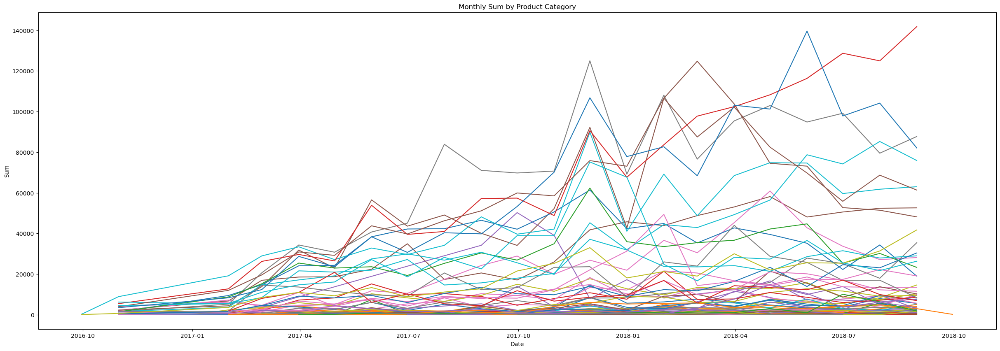

In [ ]:
grouped_df['order_purchase_timestamp'] = pd.to_datetime(grouped_df['order_purchase_timestamp'])

grouped = grouped_df.groupby(['product_category_name_english', pd.Grouper(key='order_purchase_timestamp', freq='M')])['sum'].sum().reset_index()

plt.figure(figsize=(30, 10))
plt.title('Monthly Sum by Product Category')

for category in grouped['product_category_name_english'].unique():
    category_data = grouped[grouped['product_category_name_english'] == category]
    plt.plot(category_data['order_purchase_timestamp'], category_data['sum'], label=category)

plt.xlabel('Date')
plt.ylabel('Sum')
plt.show()

In [ ]:
label_encoder = LabelEncoder()
grouped_df['product_category_name_english'] = label_encoder.fit_transform(grouped_df['product_category_name_english'])
grouped_df['geolocation_state'] = label_encoder.fit_transform(grouped_df['geolocation_state'])

In [ ]:
grouped_df = grouped_df.set_index(['order_purchase_timestamp','product_category_name_english'])

# xgboost

In [ ]:
features = ['year', 'month', 'day', 'geolocation_state']
target = 'sum'

X = grouped_df[features]
y = grouped_df[target]

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

xgb_model = XGBRegressor()
xgb_model.fit(X_train, y_train)
xgb_preds = xgb_model.predict(X_val)
xgb_rmse = mean_squared_error(y_val, xgb_preds, squared=False)
print("XGBoost RMSE:", xgb_rmse)

XGBoost RMSE: 242.12003298831362


In [ ]:
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

xgb_model = XGBRegressor()

grid_search = GridSearchCV(xgb_model, param_grid, scoring='neg_mean_squared_error', cv=5, verbose=1)

grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

best_xgb_model = grid_search.best_estimator_
xgb_preds = best_xgb_model.predict(X_val)
xgb_rmse = mean_squared_error(y_val, xgb_preds, squared=False)
print("Best XGBoost RMSE:", xgb_rmse)

Fitting 5 folds for each of 243 candidates, totalling 1215 fits
Best Hyperparameters: {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
Best XGBoost RMSE: 238.02031528786475


In [ ]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error

# 튜닝된 하이퍼파라미터
params = {
    'colsample_bytree': 0.8,
    'learning_rate': 0.1,
    'max_depth': 3,
    'n_estimators': 100,
    'subsample': 1.0
}

# XGBoost 모델 초기화
xgb_model = XGBRegressor(**params)

# 모델 훈련
xgb_model.fit(X_train, y_train)

# 검증 데이터 예측
xgb_preds = xgb_model.predict(X_val)

# RMSE 계산
xgb_rmse = mean_squared_error(y_val, xgb_preds, squared=False)

print("XGBoost RMSE:", xgb_rmse)


XGBoost RMSE: 238.02031528786475


In [ ]:

xgb_preds = xgb_model.predict(X_val)

xgb_mse = mean_squared_error(y_val, xgb_preds)
print("Mean Squared Error:", xgb_mse)

Mean Squared Error: 56653.67048973454


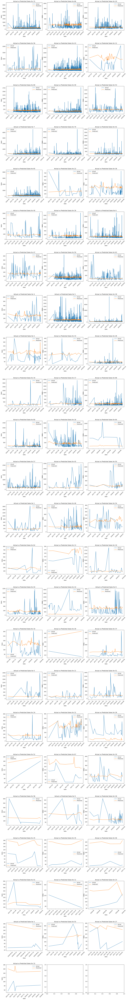

In [ ]:
xgb_preds = xgb_model.predict(X_val)

comparison_df = pd.DataFrame({
    'Actual': y_val,
    'Predicted': xgb_preds
})

categories = comparison_df.index.get_level_values('product_category_name_english').unique()

num_categories = len(categories)
num_plots_per_row = 3
num_rows = -(-num_categories // num_plots_per_row)

fig, axes = plt.subplots(num_rows, num_plots_per_row, figsize=(15, 5*num_rows))
plt.tight_layout()

for i, category in enumerate(categories):
    row = i // num_plots_per_row
    col = i % num_plots_per_row
    ax = axes[row, col]

    category_data = comparison_df.loc[comparison_df.index.get_level_values('product_category_name_english') == category]
    category_data_sorted = category_data.sort_index()

    ax.plot(category_data_sorted.index.get_level_values('order_purchase_timestamp'), category_data_sorted['Actual'], label='Actual')
    ax.plot(category_data_sorted.index.get_level_values('order_purchase_timestamp'), category_data_sorted['Predicted'], label='Predicted')
    ax.set_xlabel('Date')
    ax.set_ylabel('Sales')
    ax.set_title(f'Actual vs Predicted Sales for {category}')
    ax.legend()
    ax.tick_params(axis='x', rotation=45)


plt.subplots_adjust(hspace=0.5)

plt.show()



## catboost

In [ ]:

catboost_model = CatBoostRegressor()
catboost_model.fit(X_train, y_train)

catboost_preds = catboost_model.predict(X_val)
cats_rmse = mean_squared_error(y_val, catboost_preds, squared=False)
print("CatBoost RMSE:", cats_rmse)

Learning rate set to 0.081401
0:	learn: 252.0198613	total: 60.4ms	remaining: 1m
1:	learn: 251.9664997	total: 62.8ms	remaining: 31.3s
2:	learn: 251.9097534	total: 65.5ms	remaining: 21.8s
3:	learn: 251.8299101	total: 67.9ms	remaining: 16.9s
4:	learn: 251.7869018	total: 70.3ms	remaining: 14s
5:	learn: 251.7178096	total: 73ms	remaining: 12.1s
6:	learn: 251.6831709	total: 75.3ms	remaining: 10.7s
7:	learn: 251.6454682	total: 77.8ms	remaining: 9.64s
8:	learn: 251.5924703	total: 80.4ms	remaining: 8.86s
9:	learn: 251.5592840	total: 83ms	remaining: 8.21s
10:	learn: 251.4851473	total: 85.6ms	remaining: 7.7s
11:	learn: 251.4649090	total: 88ms	remaining: 7.25s
12:	learn: 251.4443365	total: 90.6ms	remaining: 6.88s
13:	learn: 251.4135154	total: 92.9ms	remaining: 6.54s
14:	learn: 251.3975420	total: 95.2ms	remaining: 6.25s
15:	learn: 251.3615974	total: 97.6ms	remaining: 6s
16:	learn: 251.3235329	total: 100ms	remaining: 5.8s
17:	learn: 251.2212593	total: 103ms	remaining: 5.61s
18:	learn: 251.2105235	tot

In [ ]:
param_grid = {
    'iterations': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'depth': [6, 8, 10],
    'l2_leaf_reg': [1, 3, 5],
    'subsample': [0.8, 0.9, 1.0]
}

catboost_model = CatBoostRegressor(verbose=0)

grid_search = GridSearchCV(catboost_model, param_grid, scoring='neg_mean_squared_error', cv=5, verbose=1)

grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

best_catboost_model = grid_search.best_estimator_
catboost_preds = best_catboost_model.predict(X_val)
catboost_rmse = mean_squared_error(y_val, catboost_preds, squared=False)
print("Best CatBoost RMSE:", catboost_rmse)

In [ ]:
from catboost import CatBoostRegressor
from sklearn.metrics import mean_squared_error

# 튜닝된 하이퍼파라미터
params = {
    'depth': 6,
    'iterations': 100,
    'l2_leaf_reg': 5,
    'learning_rate': 0.1,
    'subsample': 1.0
}

# CatBoost 모델 초기화
catboost_model = CatBoostRegressor(**params)

# 모델 훈련
catboost_model.fit(X_train, y_train)

# 검증 데이터 예측
catboost_preds = catboost_model.predict(X_val)

# RMSE 계산
cats_rmse = mean_squared_error(y_val, catboost_preds, squared=False)

print("CatBoost RMSE:", cats_rmse)


0:	learn: 251.9816783	total: 58.5ms	remaining: 5.79s
1:	learn: 251.8648505	total: 61.4ms	remaining: 3.01s
2:	learn: 251.8007715	total: 64.1ms	remaining: 2.07s
3:	learn: 251.7268384	total: 66.8ms	remaining: 1.6s
4:	learn: 251.6699627	total: 69.3ms	remaining: 1.32s
5:	learn: 251.6065037	total: 71.9ms	remaining: 1.13s
6:	learn: 251.5355157	total: 74.3ms	remaining: 988ms
7:	learn: 251.4898299	total: 76.9ms	remaining: 884ms
8:	learn: 251.4553848	total: 79.4ms	remaining: 803ms
9:	learn: 251.4293823	total: 81.6ms	remaining: 734ms
10:	learn: 251.3987500	total: 83.8ms	remaining: 678ms
11:	learn: 251.3638753	total: 86.4ms	remaining: 633ms
12:	learn: 251.3291177	total: 88.7ms	remaining: 594ms
13:	learn: 251.3146768	total: 91.2ms	remaining: 560ms
14:	learn: 251.2890524	total: 93.7ms	remaining: 531ms
15:	learn: 251.2608730	total: 96ms	remaining: 504ms
16:	learn: 251.2382377	total: 98.2ms	remaining: 480ms
17:	learn: 251.2205362	total: 101ms	remaining: 458ms
18:	learn: 251.1989409	total: 103ms	remain

In [ ]:

cats_preds = catboost_model.predict(X_val)

cats_mse = mean_squared_error(y_val, cats_preds)
print("Mean Squared Error:", cats_mse)

Mean Squared Error: 56611.90936565931


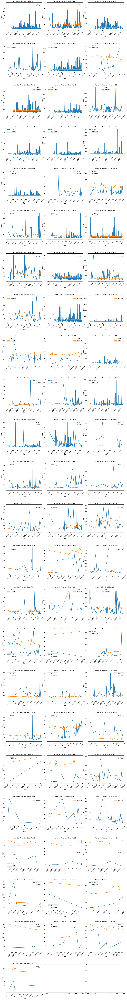

In [ ]:
cats_preds = catboost_model.predict(X_val)

comparison_df = pd.DataFrame({
    'Actual': y_val,
    'Predicted': cats_preds
})

categories = comparison_df.index.get_level_values('product_category_name_english').unique()

num_categories = len(categories)
num_plots_per_row = 3
num_rows = -(-num_categories // num_plots_per_row)

fig, axes = plt.subplots(num_rows, num_plots_per_row, figsize=(15, 5*num_rows))
plt.tight_layout()

for i, category in enumerate(categories):
    row = i // num_plots_per_row
    col = i % num_plots_per_row
    ax = axes[row, col]

    category_data = comparison_df.loc[comparison_df.index.get_level_values('product_category_name_english') == category]
    category_data_sorted = category_data.sort_index()

    ax.plot(category_data_sorted.index.get_level_values('order_purchase_timestamp'), category_data_sorted['Actual'], label='Actual')
    ax.plot(category_data_sorted.index.get_level_values('order_purchase_timestamp'), category_data_sorted['Predicted'], label='Predicted')
    ax.set_xlabel('Date')
    ax.set_ylabel('Sales')
    ax.set_title(f'Actual vs Predicted Sales for {category}')
    ax.legend()
    ax.tick_params(axis='x', rotation=45)


plt.subplots_adjust(hspace=0.5)

plt.show()


## lightGBM

In [ ]:

lgbm_model = LGBMRegressor()
lgbm_model.fit(X_train, y_train)

lgbm_preds = lgbm_model.predict(X_val)
lgbm_rmse = mean_squared_error(y_val, lgbm_preds, squared=False)
print("LightGBM RMSE:", lgbm_rmse)

LightGBM RMSE: 238.57785695381025


In [ ]:
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [6, 8, 10],
    'min_child_samples': [20, 50, 100],
    'subsample': [0.8, 0.9, 1.0]
}

lgbm_model = LGBMRegressor()

grid_search = GridSearchCV(lgbm_model, param_grid, scoring='neg_mean_squared_error', cv=5, verbose=1)

grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

best_lgbm_model = grid_search.best_estimator_
lgbm_preds = best_lgbm_model.predict(X_val)
lgbm_rmse = mean_squared_error(y_val, lgbm_preds, squared=False)
print("Best LightGBM RMSE:", lgbm_rmse)


In [ ]:
params = {
    'learning_rate': 0.01,
    'max_depth': 6,
    'min_child_samples': 100,
    'n_estimators': 200,
    'subsample': 0.8
}

lgbm_model = LGBMRegressor(**params)

lgbm_model.fit(X_train, y_train)

lgbm_preds = lgbm_model.predict(X_val)

lgbm_rmse = mean_squared_error(y_val, lgbm_preds, squared=False)

print("LightGBM RMSE:", lgbm_rmse)

LightGBM RMSE: 238.0281268108112


In [ ]:

lgbm_preds = lgbm_model.predict(X_val)

lgbm_mse = mean_squared_error(y_val, lgbm_preds)
print("Mean Squared Error:", lgbm_mse)

Mean Squared Error: 56657.38915306361


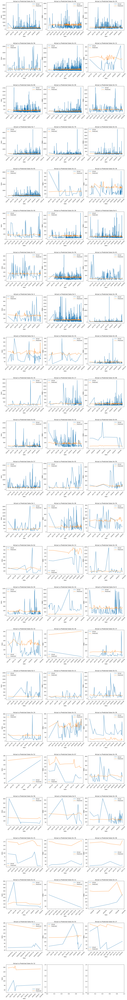

In [ ]:

lgbm_preds = lgbm_model.predict(X_val)

comparison_df = pd.DataFrame({
    'Actual': y_val,
    'Predicted': lgbm_preds
})

categories = comparison_df.index.get_level_values('product_category_name_english').unique()

num_categories = len(categories)
num_plots_per_row = 3
num_rows = -(-num_categories // num_plots_per_row)  # Calculate the number of rows

fig, axes = plt.subplots(num_rows, num_plots_per_row, figsize=(15, 5*num_rows))
plt.tight_layout()

for i, category in enumerate(categories):
    row = i // num_plots_per_row
    col = i % num_plots_per_row
    ax = axes[row, col]

    category_data = comparison_df.loc[comparison_df.index.get_level_values('product_category_name_english') == category]
    category_data_sorted = category_data.sort_index()  # Sort data by timestamp

    ax.plot(category_data_sorted.index.get_level_values('order_purchase_timestamp'), category_data_sorted['Actual'], label='Actual')
    ax.plot(category_data_sorted.index.get_level_values('order_purchase_timestamp'), category_data_sorted['Predicted'], label='Predicted')
    ax.set_xlabel('Date')
    ax.set_ylabel('Sales')
    ax.set_title(f'Actual vs Predicted Sales for {category}')
    ax.legend()
    ax.tick_params(axis='x', rotation=45)

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.5)  # You can adjust the value to control the spacing

plt.show()


## 결과

In [ ]:
result_data = {
    'model': ['xgboost', 'catboost', 'lightgbm'],
    'rmse': [xgb_rmse, cats_rmse, lgbm_rmse],
    'mse': [xgb_mse, cats_mse, lgbm_mse]
}

result_df = pd.DataFrame(result_data)

result_df


,model,rmse,mse
0,xgboost,238.020315,56653.670490
1,catboost,237.932573,56611.909366
2,lightgbm,238.028127,56657.389153


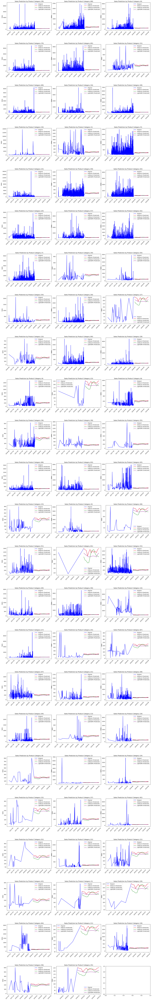

In [ ]:
prediction_months = 12

features = ['year', 'month', 'day', 'geolocation_state']
target = 'sum'

last_date = X.index.get_level_values('order_purchase_timestamp').max()
new_dates = pd.date_range(last_date, periods=prediction_months+1, freq='M')
new_data = pd.DataFrame(index=new_dates, columns=features)
new_data['geolocation_state'] = 3
new_data[['year', 'month', 'day']] = new_data.index.to_series().apply(lambda x: pd.Series([x.year, x.month, x.day]))
new_xgb_predictions = xgb_model.predict(new_data[features])
new_lgbm_predictions = lgbm_model.predict(new_data[features])
new_cat_predictions = catboost_model.predict(new_data[features])

categories = grouped_df.index.get_level_values('product_category_name_english').unique()

num_plots_per_row = 3
num_rows = -(-len(categories) // num_plots_per_row)  # Calculate the number of rows

fig, axes = plt.subplots(num_rows, num_plots_per_row, figsize=(18, 5*num_rows))
plt.tight_layout()

for i, category in enumerate(categories):
    row = i // num_plots_per_row
    col = i % num_plots_per_row
    ax = axes[row, col]

    category_data = grouped_df.xs(category, level='product_category_name_english')
    combined_data = pd.concat([category_data, pd.DataFrame(new_xgb_predictions, index=new_data.index, columns=['sum'])])

    ax.plot(combined_data.index, combined_data['sum'], color='blue', label='Original')
    ax.plot(new_data.index, new_xgb_predictions, color='red', label='XGBoost (Predicted)')
    ax.plot(new_data.index, new_cat_predictions, color='green', label='CatBoost (Predicted)')
    ax.plot(new_data.index, new_lgbm_predictions, color='purple', label='LightGBM (Predicted)')

    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax.set_ylabel('Sales')
    ax.set_title(f'Sales Prediction by Product Category ({category})')
    ax.legend()
    ax.tick_params(axis='x', rotation=45)

plt.subplots_adjust(hspace=0.5)

plt.show()


In [ ]:
new_data = pd.DataFrame({
    'year': [2018],
    'month': [1],
    'day': [20],
    'geolocation_state': [4]
})

new_xgb_prediction = xgb_model.predict(new_data)

new_cat_prediction = catboost_model.predict(new_data)

new_lgbm_prediction = lgbm_model.predict(new_data)

print(f'XGBoost :{new_xgb_prediction}')
print(f'CatBoost :{new_cat_prediction}')
print(f'LightGBM :{new_lgbm_prediction}')

XGBoost :[174.3299]
CatBoost :[171.22365553]
LightGBM :[175.06452464]
